In [4]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, exposure, feature
from skimage.filters import unsharp_mask, rank
from skimage.morphology import disk
from scipy.ndimage import gaussian_laplace
from tqdm import tqdm
from PIL import Image, ImageStat
from collections import defaultdict
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.callbacks import EarlyStopping
import keras_tuner as kt
import warnings

warnings.filterwarnings("ignore")


# EDA of the dataset

## Class Distribution

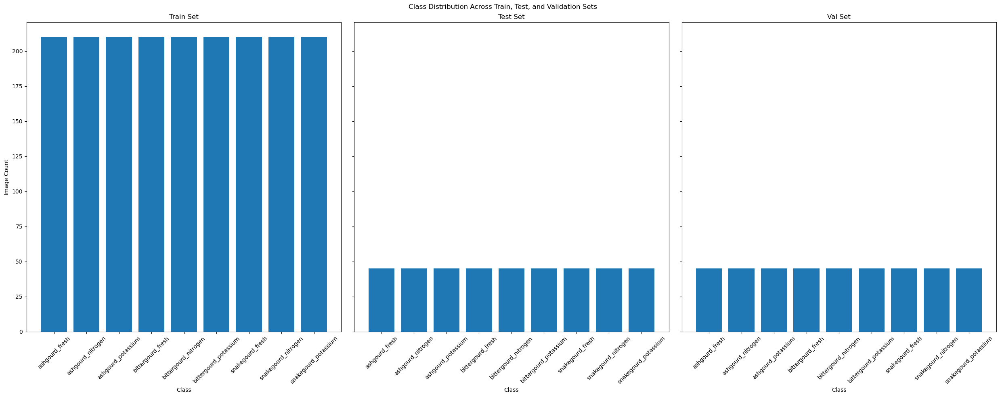

In [2]:
# Define the base directory
base_dir = r"./Dataset"

# Function to count images in each class for train, test, and validation sets
def count_images_in_folders(base_dir):
    class_counts = defaultdict(lambda: defaultdict(int))
    for split in ['train', 'test', 'val']:
        split_path = os.path.join(base_dir, split)
        if os.path.exists(split_path):
            for class_name in os.listdir(split_path):
                class_dir = os.path.join(split_path, class_name)
                if os.path.isdir(class_dir):
                    class_counts[split][class_name] = len(os.listdir(class_dir))
    return class_counts

# Get the class distribution
class_distribution = count_images_in_folders(base_dir)


fig, ax = plt.subplots(1, 3, figsize=(25, 10), sharey=True)

for idx, split in enumerate(['train', 'test', 'val']):
    class_counts = class_distribution.get(split, {})
    ax[idx].bar(class_counts.keys(), class_counts.values())
    ax[idx].set_title(f"{split.capitalize()} Set")
    ax[idx].set_xlabel("Class")
    ax[idx].set_ylabel("Image Count" if idx == 0 else "")
    ax[idx].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

plt.suptitle("Class Distribution Across Train, Test, and Validation Sets")
plt.tight_layout()
plt.show()


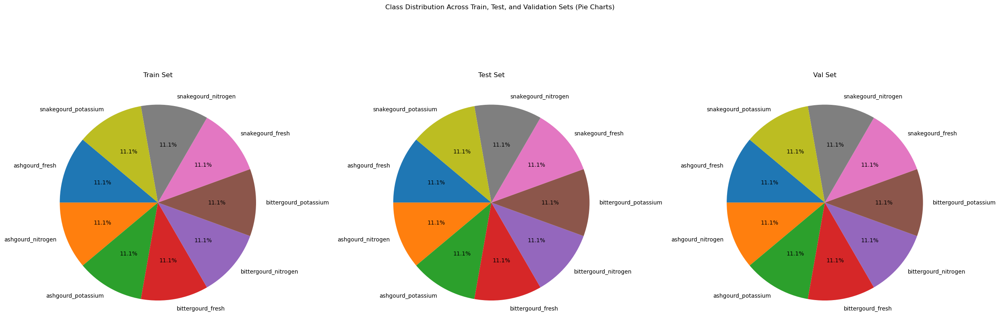

In [3]:
fig, ax = plt.subplots(1, 3, figsize=(25, 10))

for idx, split in enumerate(['train', 'test', 'val']):
    class_counts = class_distribution.get(split, {})
    ax[idx].pie(class_counts.values(), labels=class_counts.keys(), autopct='%1.1f%%', startangle=140)
    ax[idx].set_title(f"{split.capitalize()} Set")

plt.suptitle("Class Distribution Across Train, Test, and Validation Sets (Pie Charts)")
plt.tight_layout()
plt.show()

### Random Images display from the dataset

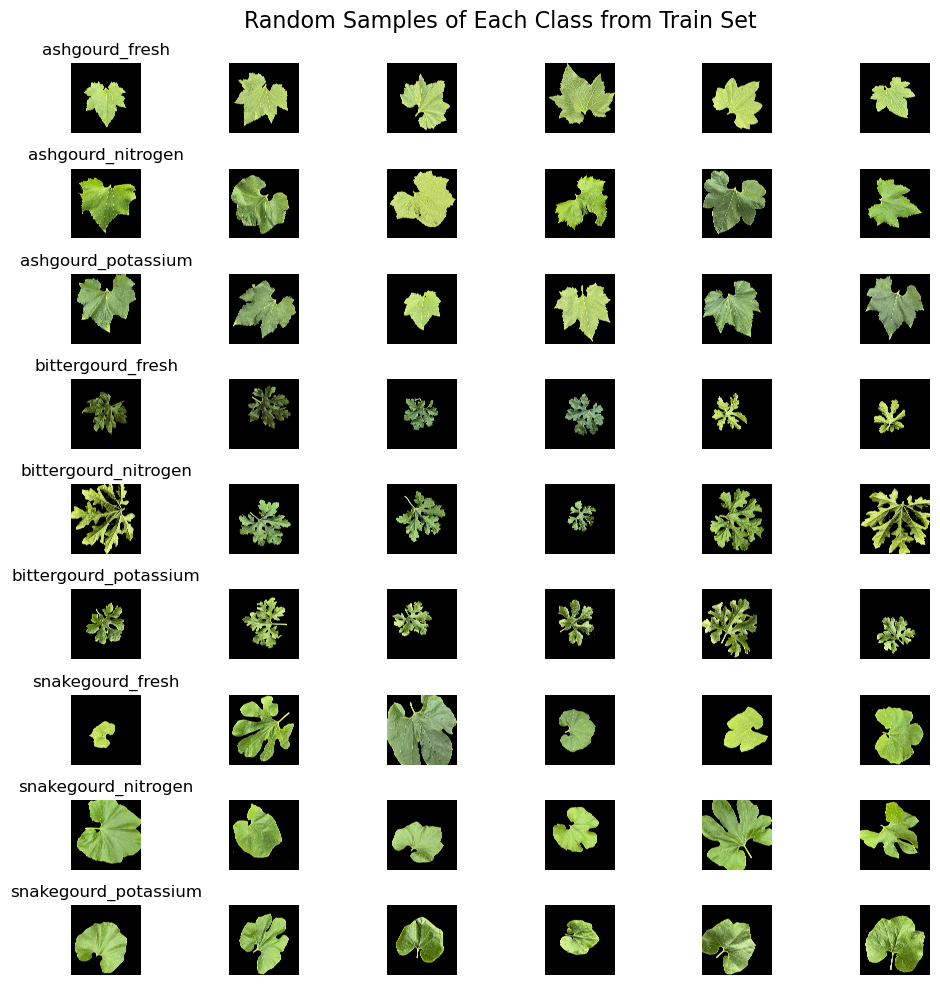

In [4]:
# Function to display random images from each class
def display_random_images(base_dir, num_images=6):
    # Increase the figsize to make images larger
    fig, axes = plt.subplots(len(class_distribution['train']), num_images, figsize=(10, 10))
    
    for idx, class_name in enumerate(class_distribution['train'].keys()):
        class_path = os.path.join(base_dir, 'train', class_name)
        image_files = os.listdir(class_path)
        sampled_images = random.sample(image_files, min(num_images, len(image_files)))
        
        for jdx, image_file in enumerate(sampled_images):
            img_path = os.path.join(class_path, image_file)
            img = Image.open(img_path)
            axes[idx, jdx].imshow(img)
            axes[idx, jdx].axis('off')
            if jdx == 0:
                axes[idx, jdx].set_title(class_name, fontsize=12)  # Optional: Set a font size for class titles
                
    plt.suptitle("Random Samples of Each Class from Train Set", fontsize=16)
    plt.tight_layout()
    plt.show()

# Display random images from each class in the train set
display_random_images(base_dir)

### Images size distribution

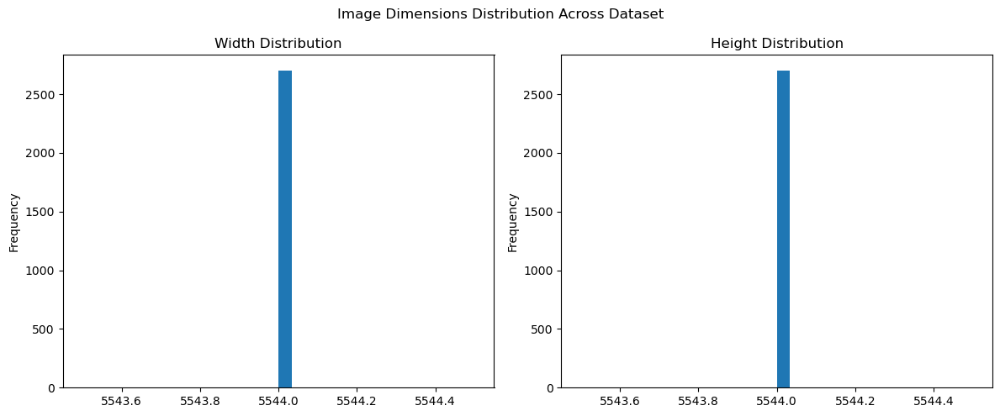

Width standard deviation: 0.0
Height standard deviation: 0.0
All images have the same dimensions. Reshaping may not be required.


In [5]:
# Function to gather image dimensions from a directory
def calculate_image_dimensions(base_dir):
    dimensions = defaultdict(list)
    for split in ['train', 'test', 'val']:
        split_path = os.path.join(base_dir, split)
        if os.path.exists(split_path):
            for class_name in os.listdir(split_path):
                class_dir = os.path.join(split_path, class_name)
                if os.path.isdir(class_dir):
                    for image_file in os.listdir(class_dir):
                        img_path = os.path.join(class_dir, image_file)
                        with Image.open(img_path) as img:
                            width, height = img.size
                            dimensions[split].append((width, height))
    return dimensions

# Calculate image dimensions
image_dimensions = calculate_image_dimensions(base_dir)

# Convert dimensions to a DataFrame for easier analysis
dimension_data = {'split': [], 'width': [], 'height': []}
for split, dims in image_dimensions.items():
    for (width, height) in dims:
        dimension_data['split'].append(split)
        dimension_data['width'].append(width)
        dimension_data['height'].append(height)

df = pd.DataFrame(dimension_data)

# Display the distribution of image dimensions
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
df['width'].plot(kind='hist', bins=30, ax=ax[0], title="Width Distribution")
df['height'].plot(kind='hist', bins=30, ax=ax[1], title="Height Distribution")
plt.suptitle("Image Dimensions Distribution Across Dataset")
plt.tight_layout()
plt.show()

width_std_dev = df['width'].std()
height_std_dev = df['height'].std()
print(f"Width standard deviation: {width_std_dev}")
print(f"Height standard deviation: {height_std_dev}")
if width_std_dev > 0 or height_std_dev > 0:
    print("Images have varying dimensions. Consider resizing them to a uniform shape (e.g., 224x224) for model consistency.")
else:
    print("All images have the same dimensions. Reshaping may not be required.")


### Image brightness and Contrast distribution

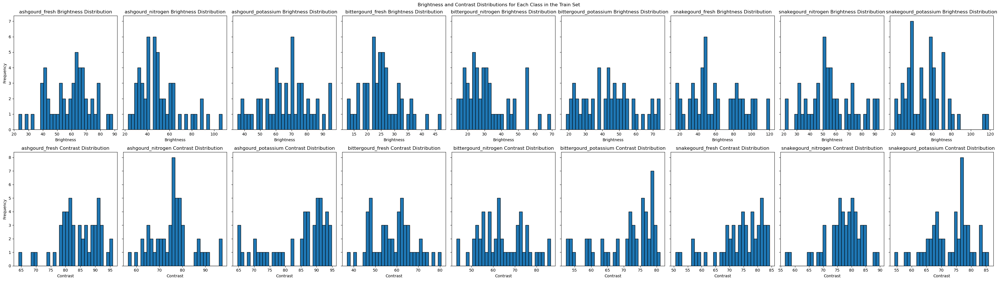

In [6]:
# Function to calculate brightness and contrast statistics for each class in the train set
def calculate_brightness_contrast_train(base_dir, num_images=50):
    brightness_contrast = defaultdict(lambda: {'brightness': [], 'contrast': []})
    
    train_path = os.path.join(base_dir, 'train')
    if os.path.exists(train_path):
        for class_name in os.listdir(train_path):
            class_path = os.path.join(train_path, class_name)
            if os.path.isdir(class_path):
                image_files = os.listdir(class_path)
                sampled_images = random.sample(image_files, min(num_images, len(image_files)))
                
                for image_file in sampled_images:
                    img_path = os.path.join(class_path, image_file)
                    img = Image.open(img_path).convert("L")  # Convert to grayscale
                    
                    # Calculate brightness as the mean pixel intensity
                    stat = ImageStat.Stat(img)
                    brightness = stat.mean[0]
                    
                    # Calculate contrast as the standard deviation of pixel intensities
                    contrast = stat.stddev[0]
                    
                    # Store the values for each class
                    brightness_contrast[class_name]['brightness'].append(brightness)
                    brightness_contrast[class_name]['contrast'].append(contrast)
                        
    return brightness_contrast

# Calculate brightness and contrast for each class in the train set
brightness_contrast_train_data = calculate_brightness_contrast_train(base_dir)

# Plot brightness and contrast distributions for each class in the train set
fig, axes = plt.subplots(2, len(brightness_contrast_train_data), figsize=(35, 10), sharey='row')

for idx, (class_name, data) in enumerate(brightness_contrast_train_data.items()):
    # Brightness distribution
    axes[0, idx].hist(data['brightness'], bins=30, edgecolor='black')
    axes[0, idx].set_title(f"{class_name} Brightness Distribution")
    axes[0, idx].set_xlabel("Brightness")
    axes[0, idx].set_ylabel("Frequency" if idx == 0 else "")
    
    # Contrast distribution
    axes[1, idx].hist(data['contrast'], bins=30, edgecolor='black')
    axes[1, idx].set_title(f"{class_name} Contrast Distribution")
    axes[1, idx].set_xlabel("Contrast")
    axes[1, idx].set_ylabel("Frequency" if idx == 0 else "")

plt.suptitle("Brightness and Contrast Distributions for Each Class in the Train Set")
plt.tight_layout()
plt.show()


### Texture analysis

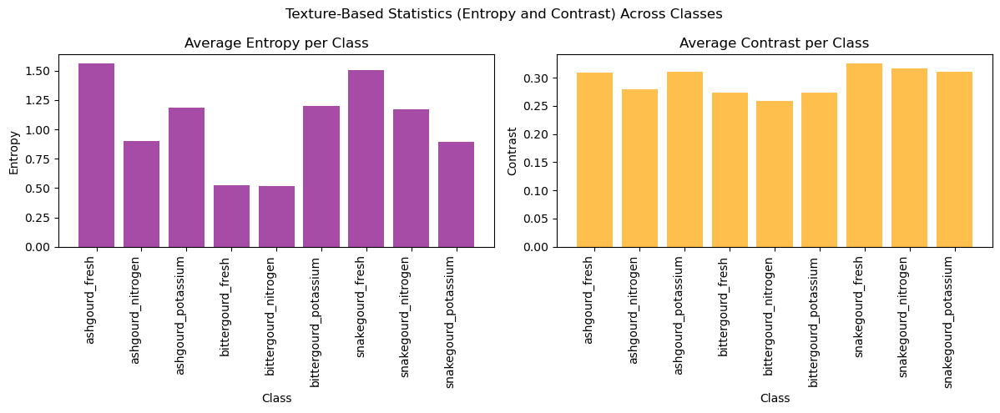

In [7]:
# Function to calculate entropy and contrast for images in each class
def calculate_texture_features(base_dir, num_images=5):
    texture_stats = defaultdict(lambda: {'entropy': [], 'contrast': []})
    
    for class_name in os.listdir(os.path.join(base_dir, 'train')):
        class_path = os.path.join(base_dir, 'train', class_name)
        if os.path.isdir(class_path):
            image_files = os.listdir(class_path)
            sampled_images = image_files[:num_images]
            
            for image_file in sampled_images:
                img_path = os.path.join(class_path, image_file)
                img = io.imread(img_path)
                
                # Convert to grayscale for texture analysis
                gray_img = color.rgb2gray(img)
                
                # Calculate entropy and contrast
                entropy = rank.entropy(gray_img, disk(3)).mean()
                contrast = gray_img.std()
                
                texture_stats[class_name]['entropy'].append(entropy)
                texture_stats[class_name]['contrast'].append(contrast)
    
    return texture_stats

# Calculate texture features
texture_features = calculate_texture_features(base_dir)

# Plot texture statistics for each class
classes = texture_features.keys()
avg_entropy = [np.mean(texture_features[cls]['entropy']) for cls in classes]
avg_contrast = [np.mean(texture_features[cls]['contrast']) for cls in classes]

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Plot average entropy
ax[0].bar(classes, avg_entropy, color='purple', alpha=0.7)
ax[0].set_title("Average Entropy per Class")
ax[0].set_ylabel("Entropy")
ax[0].set_xlabel("Class")
ax[0].set_xticks(range(len(classes)))
ax[0].set_xticklabels(classes, rotation=90, ha='right')  # Rotate labels

# Plot average contrast
ax[1].bar(classes, avg_contrast, color='orange', alpha=0.7)
ax[1].set_title("Average Contrast per Class")
ax[1].set_ylabel("Contrast")
ax[1].set_xlabel("Class")
ax[1].set_xticks(range(len(classes)))
ax[1].set_xticklabels(classes, rotation=90, ha='right')  # Rotate labels

plt.suptitle("Texture-Based Statistics (Entropy and Contrast) Across Classes")
plt.tight_layout()
plt.show()


### Feature Clustering

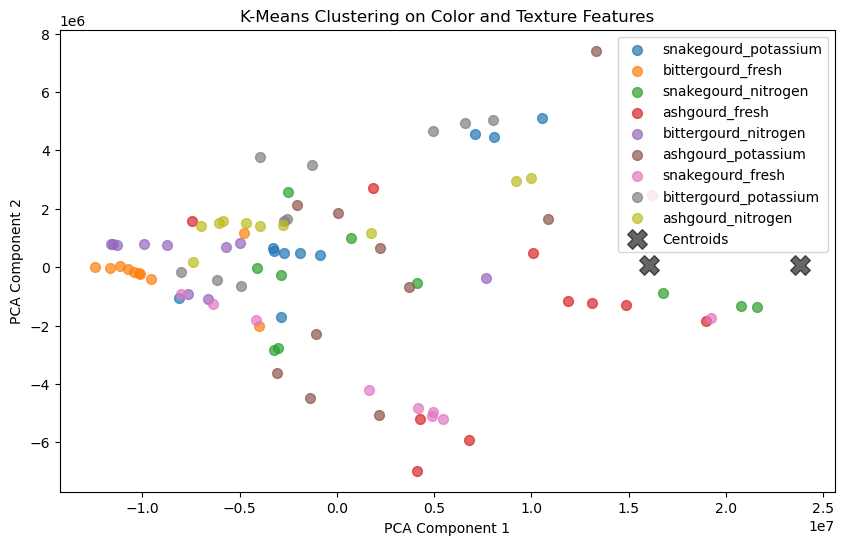

In [8]:
# Function to extract color and texture features
def extract_features(base_dir, num_images=10):
    features = []
    labels = []
    
    for class_name in os.listdir(os.path.join(base_dir, 'train')):
        class_path = os.path.join(base_dir, 'train', class_name)
        if os.path.isdir(class_path):
            image_files = os.listdir(class_path)
            sampled_images = image_files[:num_images]
            
            for image_file in sampled_images:
                img_path = os.path.join(class_path, image_file)
                img = io.imread(img_path)
                
                # Convert to grayscale for texture features
                gray_img = color.rgb2gray(img)
                
                # Calculate color histograms (using 10 bins per channel)
                r_hist, _ = np.histogram(img[:, :, 0], bins=10, range=(0, 256))
                g_hist, _ = np.histogram(img[:, :, 1], bins=10, range=(0, 256))
                b_hist, _ = np.histogram(img[:, :, 2], bins=10, range=(0, 256))
                
                # Calculate texture features (entropy and contrast)
                entropy = rank.entropy(gray_img, disk(3)).mean()
                contrast = gray_img.std()
                
                # Combine color histograms and texture features into one feature vector
                feature_vector = np.hstack([r_hist, g_hist, b_hist, entropy, contrast])
                features.append(feature_vector)
                labels.append(class_name)
                
    return np.array(features), labels

# Extract features
features, labels = extract_features(base_dir)

# Perform dimensionality reduction with PCA for visualization
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(features)

# K-Means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(features)

# Plot clustering results
plt.figure(figsize=(10, 6))
for i, class_name in enumerate(set(labels)):
    idx = [j for j, label in enumerate(labels) if label == class_name]
    plt.scatter(reduced_features[idx, 0], reduced_features[idx, 1], label=class_name, s=50, alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='black', s=200, alpha=0.6, marker='X', label='Centroids')
plt.title("K-Means Clustering on Color and Texture Features")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()


## Data preprocessing

### Laplacian of Gaussian

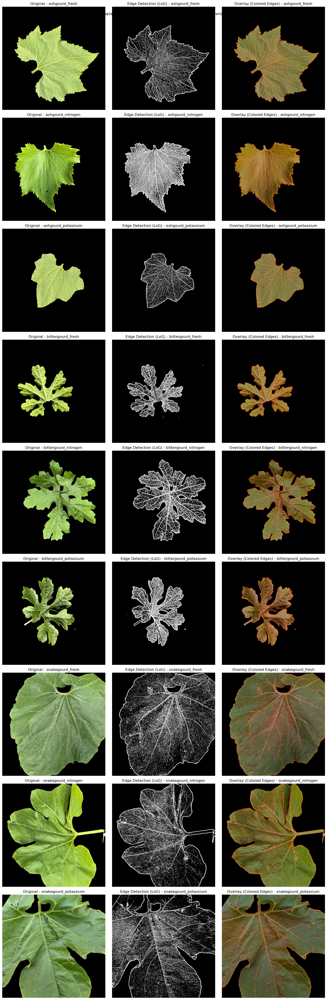

In [9]:
base_dir = "./Dataset"

# Function to preprocess the image
def preprocess_image(image):
    # Normalize the image contrast
    image = image / 255.0 if image.max() > 1 else image
    return image

# Function to apply LoG
def apply_log(image_path, sigma=4, threshold=0.001):
    # Read and preprocess the image
    image = io.imread(image_path)
    gray_image = color.rgb2gray(preprocess_image(image))
    
    # Apply Laplacian of Gaussian 
    log_image = gaussian_laplace(gray_image, sigma=sigma)
    
    edge_image = np.abs(log_image) > threshold  
    return edge_image
# Function to colorize edges
def colorize_edges(edge_image, color=(1, 0, 0)):
    # Create an RGB version of the edge image
    color_edges = np.zeros((*edge_image.shape, 3))
    color_edges[edge_image] = color  
    return color_edges

# Function to overlay the edge-detected image on the original image
def overlay_log_on_original(original_image, edge_image, alpha=0.4, color=(1, 0, 0)):
    # Colorize edges
    color_edges = colorize_edges(edge_image, color)
    
    # Ensure original image is normalized
    original_image = preprocess_image(original_image)
    
    # Blend the images using the alpha parameter
    overlay_image = (1 - alpha) * original_image + alpha * color_edges
    overlay_image = np.clip(overlay_image, 0, 1) 
    return overlay_image


# Modified function to apply LoG for edge detection, overlay, and display samples from each class
def display_log_samples_per_class(base_dir, num_images=1, sigma=6, threshold=0.03, alpha=0.4, color=(1, 0, 0)):
    train_path = os.path.join(base_dir, 'train')
    classes = os.listdir(train_path)
    fig, axes = plt.subplots(len(classes), 3, figsize=(15, len(classes) * 5))
    
    for idx, class_name in enumerate(classes):
        class_path = os.path.join(train_path, class_name)
        image_files = os.listdir(class_path)
        
        # Sample a single image from each class
        sampled_image = random.choice(image_files)
        image_path = os.path.join(class_path, sampled_image)
        
        # Load original image and apply LoG for edge detection
        original_image = io.imread(image_path)
        edge_image = apply_log(image_path, sigma=sigma, threshold=threshold)
        overlay_image = overlay_log_on_original(original_image, edge_image, alpha=alpha, color=color)
        
        # Display original, edge-detected, and overlay images side by side
        axes[idx, 0].imshow(original_image)
        axes[idx, 0].set_title(f"Original - {class_name}")
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(edge_image, cmap='gray')
        axes[idx, 1].set_title(f"Edge Detection (LoG) - {class_name}")
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(overlay_image)
        axes[idx, 2].set_title(f"Overlay (Colored Edges) - {class_name}")
        axes[idx, 2].axis('off')
        
    plt.suptitle("Laplacian of Gaussian (LoG) Edge Detection with Colored Overlay")
    plt.tight_layout()
    plt.show()


display_log_samples_per_class(base_dir, num_images=1, sigma=4, threshold=0.001, alpha=0.4, color=(1, 0, 0))

### Canny edge detection

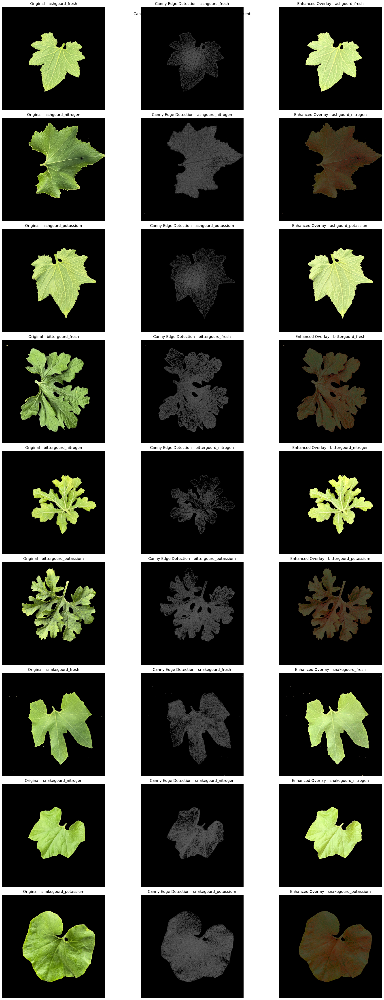

In [10]:
# Function to apply Canny edge detection on an image
def apply_canny(image_path, sigma=1.0, low_threshold=0.05, high_threshold=0.15):
    # Read and convert the image to grayscale
    image = io.imread(image_path)
    gray_image = color.rgb2gray(image)
    
    # Apply Canny edge detection with thresholds
    edges = feature.canny(gray_image, sigma=sigma, low_threshold=low_threshold, high_threshold=high_threshold)
    return edges

def enhance_image(image, gamma=0.8, contrast_low=2, contrast_high=98):
    bright_image = exposure.adjust_gamma(image, gamma=gamma)
    p_low, p_high = np.percentile(bright_image, (contrast_low, contrast_high))
    contrast_image = exposure.rescale_intensity(bright_image, in_range=(p_low, p_high))
    sharp_image = unsharp_mask(contrast_image, radius=2, amount=1)
    return np.clip(sharp_image, 0, 1)

# Function to overlay the edge-detected image on the original image
def overlay_edges_on_original(original_image, edge_image, alpha=0.4, color=(1, 0, 0)):
    # Ensure original image is normalized
    if original_image.max() > 1:
        original_image = original_image / 255.0
    # Colorize edges
    color_edges = colorize_edges(edge_image, color)
    
    # Blend the images using the alpha parameter
    overlay_image = np.clip((1 - alpha) * original_image + alpha * color_edges, 0, 1)
    return overlay_image

# Modified function to display Canny edge detection, overlay, and enhanced samples
def display_canny_samples_per_class(base_dir, sigma=1.0, alpha=0.4, color=(1, 0, 0)):
    train_path = os.path.join(base_dir, 'train')
    classes = os.listdir(train_path)
    fig, axes = plt.subplots(len(classes), 3, figsize=(20, len(classes) * 5))
    
    for idx, class_name in enumerate(classes):
        class_path = os.path.join(train_path, class_name)
        image_files = os.listdir(class_path)
        
        # Sample a single image from each class
        sampled_image = random.choice(image_files)
        image_path = os.path.join(class_path, sampled_image)
        
        # Load original image and apply Canny edge detection
        original_image = io.imread(image_path)
        edge_image = apply_canny(image_path, sigma=sigma)
        overlay_image = overlay_edges_on_original(original_image, edge_image, alpha=alpha, color=color)
        enhanced_image = enhance_image(overlay_image)
        
        # Display original, edge-detected, overlay, and enhanced images side by side
        axes[idx, 0].imshow(original_image)
        axes[idx, 0].set_title(f"Original - {class_name}")
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(edge_image, cmap='gray')
        axes[idx, 1].set_title(f"Canny Edge Detection - {class_name}")
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(enhanced_image)
        axes[idx, 2].set_title(f"Enhanced Overlay - {class_name}")
        axes[idx, 2].axis('off')
        
    plt.suptitle("Canny Edge Detection with Colored Overlay and Enhancement")
    plt.tight_layout()
    plt.show()

# Example usage with updated parameters
base_dir = "./Dataset"
display_canny_samples_per_class(base_dir, sigma=.01, alpha=0.8, color=(1, 0, 0))


### Combining the preprocessing methods

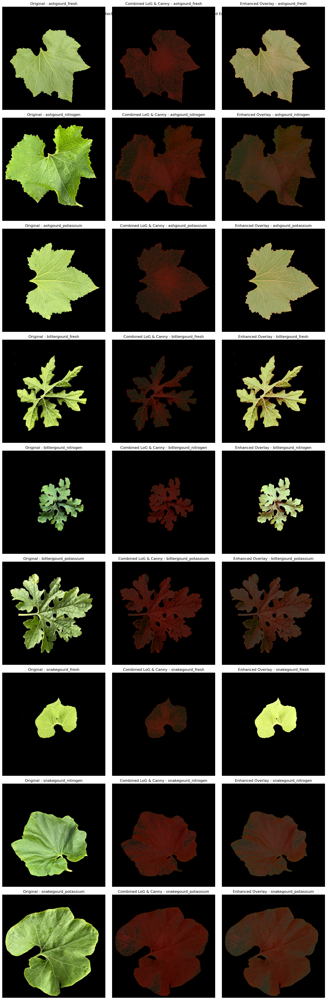

In [11]:
# Function to apply Canny edge detection on an image
def apply_canny(image, sigma=1.0, low_threshold=0.05, high_threshold=0.15):
    # Convert to grayscale
    gray_image = color.rgb2gray(image)
    # Apply Canny edge detection with thresholds
    edges = feature.canny(gray_image, sigma=sigma, low_threshold=low_threshold, high_threshold=high_threshold)
    return edges

# Function to apply LoG (Laplacian of Gaussian) edge detection
def apply_log(image, sigma=2, threshold=0.1):
    gray_image = color.rgb2gray(image)
    log_image = gaussian_laplace(gray_image, sigma=sigma)
    return log_image < -threshold

# Function to colorize edges
def colorize_edges(edge_image, edge_color=(1, 0, 0)):
    # Create an RGB version of the edge image
    color_edges = np.zeros((*edge_image.shape, 3))
    color_edges[edge_image] = edge_color
    return color_edges

# Function to increase brightness, contrast, and sharpness of an image
def enhance_image(image, gamma=0.8, contrast_low=2, contrast_high=98):
    # Adjust brightness using gamma
    bright_image = exposure.adjust_gamma(image, gamma=gamma)
    
    # Adjust contrast using percentile-based rescaling
    p_low, p_high = np.percentile(bright_image, (contrast_low, contrast_high))
    contrast_image = exposure.rescale_intensity(bright_image, in_range=(p_low, p_high))
    
    # Apply unsharp mask to enhance sharpness
    sharp_image = unsharp_mask(contrast_image, radius=2, amount=1)
    return np.clip(sharp_image, 0, 1)

# Function to overlay edge-detected images on the original image
def overlay_edges_on_original(original_image, edge_image, alpha=0.4, edge_color=(1, 0, 0)):
    # Ensure original image is normalized
    if original_image.max() > 1:
        original_image = original_image / 255.0
    
    # Colorize edges
    color_edges = colorize_edges(edge_image, edge_color)
    
    # Blend the images using the alpha parameter
    overlay_image = np.clip((1 - alpha) * original_image + alpha * color_edges, 0, 1)
    return overlay_image

# Function to display edge detection results
def display_edge_detection_samples(base_dir, num_images=1, sigmal=4, thresholdl=0.001, alphal=0.4, colorl=(1, 0, 0), sigma=.01, alpha=0.8, color=(1, 0, 0)):
    train_path = os.path.join(base_dir, 'train')
    classes = os.listdir(train_path)
    fig, axes = plt.subplots(len(classes), 3, figsize=(15, len(classes) * 5))

    for idx, class_name in enumerate(classes):
        class_path = os.path.join(train_path, class_name)
        image_files = os.listdir(class_path)

        # Sample a single image from each class
        sampled_image = random.choice(image_files)
        image_path = os.path.join(class_path, sampled_image)

        # Load original image
        original_image = io.imread(image_path)
        
        # Apply LoG and overlay
        edge_image_log = apply_log(original_image, sigma=sigmal, threshold=thresholdl)
        overlay_image_log = overlay_edges_on_original(original_image, edge_image_log, alpha=alphal, edge_color=colorl)
        
        # Apply Canny and overlay
        edge_image_canny = apply_canny(original_image, sigma=sigma)
        overlay_image_canny = overlay_edges_on_original(overlay_image_log, edge_image_canny, alpha=alpha, edge_color=color)
        
        # Enhance final result
        enhanced_image = enhance_image(overlay_image_canny)
        
        # Display original image
        axes[idx, 0].imshow(original_image)
        axes[idx, 0].set_title(f"Original - {class_name}")
        axes[idx, 0].axis('off')

        # Display combined overlay image
        axes[idx, 1].imshow(overlay_image_canny)
        axes[idx, 1].set_title(f"Combined LoG & Canny - {class_name}")
        axes[idx, 1].axis('off')
        
        # Display enhanced image
        axes[idx, 2].imshow(enhanced_image)
        axes[idx, 2].set_title(f"Enhanced Overlay - {class_name}")
        axes[idx, 2].axis('off')

    plt.suptitle("Edge Detection with LoG & Canny - Original, Combined Overlay, and Enhanced")
    plt.tight_layout()
    plt.show()

# Example usage
base_dir = "./Dataset"
display_edge_detection_samples(base_dir)


### Saving Preprocessed images

In [12]:
# Function to preprocess and save enhanced images
def preprocess_and_save_images(base_dir, output_dir, sigmal=4, thresholdl=0.001, alphal=0.4, colorl=(1, 0, 0), sigma=0.01, alpha=0.8, color=(1, 0, 0)):
    os.makedirs(output_dir, exist_ok=True)
    
    # Iterate through train, test, and val folders
    for folder_path in ['train', 'test', 'val']:
        folder_input_path = os.path.join(base_dir, folder_path)
        folder_output_path = os.path.join(output_dir, folder_path)
        os.makedirs(folder_output_path, exist_ok=True)
        
        # Iterate through class folders
        classes = os.listdir(folder_input_path)
        for class_name in classes:
            class_input_path = os.path.join(folder_input_path, class_name)
            class_output_path = os.path.join(folder_output_path, class_name)
            os.makedirs(class_output_path, exist_ok=True)
            
            # Process images
            image_files = os.listdir(class_input_path)
            for image_file in tqdm(image_files, desc=f"Processing {folder_path}/{class_name}", leave=False):
                image_path = os.path.join(class_input_path, image_file)
                output_path = os.path.join(class_output_path, image_file)

                # Skip processing if the file already exists
                if os.path.exists(output_path):
                    continue

                # Load original image
                original_image = io.imread(image_path)

                # Apply LoG and overlay
                edge_image_log = apply_log(original_image, sigma=sigmal, threshold=thresholdl)
                overlay_image_log = overlay_edges_on_original(original_image, edge_image_log, alpha=alphal, edge_color=colorl)

                # Apply Canny and overlay
                edge_image_canny = apply_canny(original_image, sigma=sigma)
                overlay_image_canny = overlay_edges_on_original(overlay_image_log, edge_image_canny, alpha=alpha, edge_color=color)

                # Enhance final result
                enhanced_image = enhance_image(overlay_image_canny)

                # Save the enhanced image                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
                io.imsave(output_path, (enhanced_image * 255).astype(np.uint8))

# Example usage
base_dir = "./Dataset"
output_dir = "./preprocessed_images"
preprocess_and_save_images(base_dir, output_dir)
print('Saving completed')

Saving completed


# Building Deep learning model

## CNN model original images

In [5]:
base_dir = "./Dataset"
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Data Augmentation and Data Generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=40,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical'
)


Found 1890 images belonging to 9 classes.
Found 405 images belonging to 9 classes.
Found 405 images belonging to 9 classes.


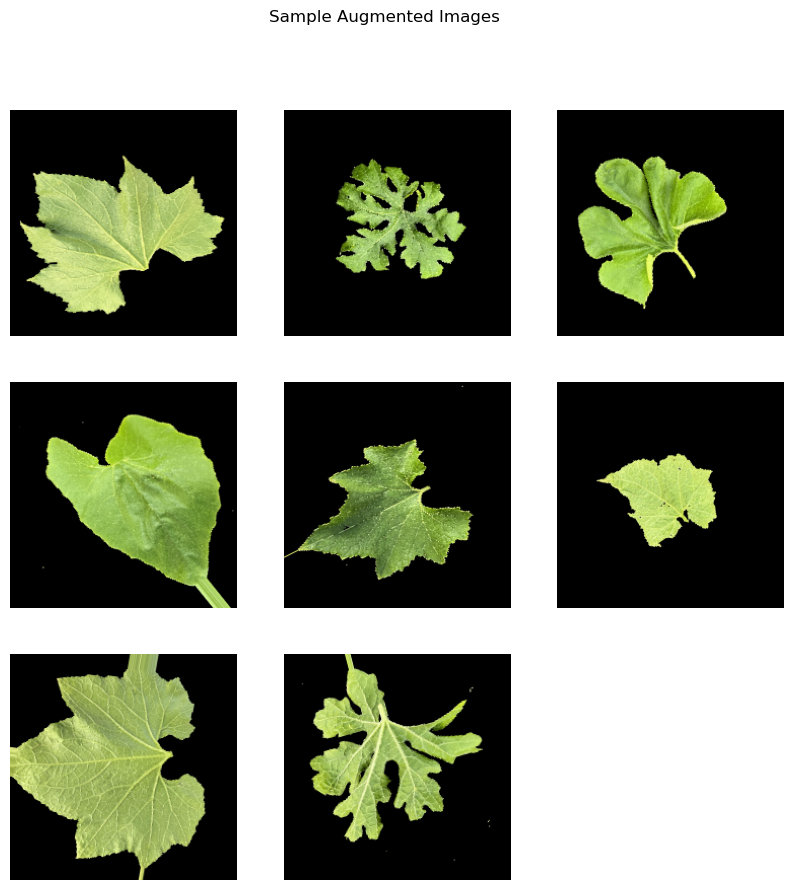

In [4]:
# Display some augmented images
def display_augmented_images(generator):
    images, labels = next(generator)
    plt.figure(figsize=(10, 10))
    for i in range(8):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
    plt.suptitle("Sample Augmented Images")
    plt.show()

# Display augmented images from the training set
display_augmented_images(train_generator)

In [6]:
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(len(train_generator.class_indices), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 128)      0

In [70]:
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=20,
    validation_data=val_generator,
    validation_steps=len(val_generator)
)

Epoch 1/20
237/237 [==============================] - 536s 1s/step - loss: 7.1152 - accuracy: 0.3690 - val_loss: 6.8230 - val_accuracy: 0.3984
Epoch 2/20
237/237 [==============================] - 459s 2s/step - loss: 6.6708 - accuracy: 0.3435 - val_loss: 6.7336 - val_accuracy: 0.4001
Epoch 3/20
237/237 [==============================] - 451s 1s/step - loss: 6.5396 - accuracy: 0.4157 - val_loss: 6.3396 - val_accuracy: 0.4206
Epoch 4/20
237/237 [==============================] - 537s 2s/step - loss: 6.4290 - accuracy: 0.4168 - val_loss: 6.4501 - val_accuracy: 0.4187
Epoch 5/20
237/237 [==============================] - 453s 1s/step - loss: 5.8584 - accuracy: 0.4452 - val_loss: 6.1460 - val_accuracy: 0.4312
Epoch 6/20
237/237 [==============================] - 530s 1s/step - loss: 5.7724 - accuracy: 0.4830 - val_loss: 6.2450 - val_accuracy: 0.4275
Epoch 7/20
237/237 [==============================] - 539s 1s/step - loss: 5.6232 - accuracy: 0.4709 - val_loss: 6.0715 - val_accuracy: 0.4636

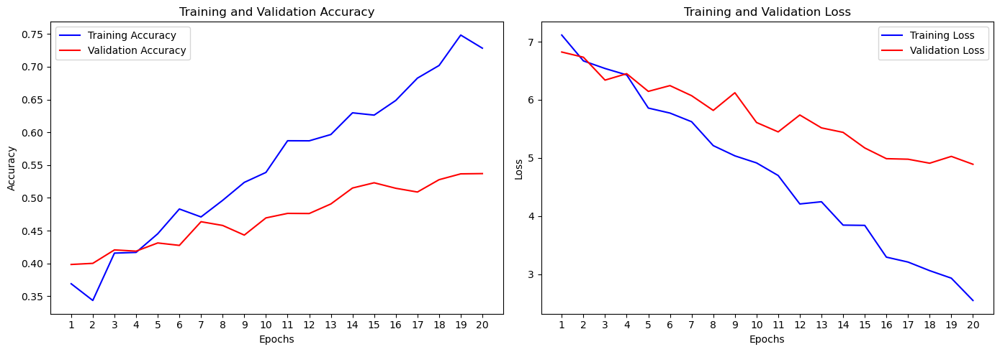

In [1]:
def plot_learning_curves(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(acc) + 1)
    
    plt.figure(figsize=(14, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b', label='Training accuracy')
    plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    
    plt.show()

# Display the learning curves
plot_learning_curves(history)

In [65]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Test loss: {test_loss:.2f}")

Test Accuracy: 0.51
Test loss: 3.24


## InceptionResNetV2 model original images

In [19]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import os

# Load InceptionResNetV2 model with pre-trained ImageNet weights, without the top layer
base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers to retain pre-trained features
base_model.trainable = False

# Add custom layers on top of the pre-trained model
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(len(train_generator.class_indices), activation='softmax')(x)

# Complete model with InceptionResNetV2 base and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d_4[0][0]']               
 alization)                     )                                                             

 batch_normalization_5 (BatchNo  (None, 25, 25, 96)  288         ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_11[0][0]']              
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 25, 25, 96)  288         ['conv2d_14[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 25, 25, 64)  192         ['conv2d_15[0][0]']              
 ormalizat

 activation_21 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_21[0][0]'] 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_1_ac[0][0]']           
                                                                                                  
 conv2d_26 (Conv2D)             (None, 25, 25, 48)   13824       ['activation_21[0][0]']          
                                                                                                  
 batch_normalization_19 (BatchN  (None, 25, 25, 32)  96          ['conv2d_23[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_22 (BatchN  (None, 25, 25, 48)  144         ['conv2d_26[0][0]']              
 ormalizat

                                                                                                  
 activation_24 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_24[0][0]'] 
                                                                                                  
 activation_26 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_26[0][0]'] 
                                                                                                  
 activation_29 (Activation)     (None, 25, 25, 64)   0           ['batch_normalization_29[0][0]'] 
                                                                                                  
 block35_3_mixed (Concatenate)  (None, 25, 25, 128)  0           ['activation_24[0][0]',          
                                                                  'activation_26[0][0]',          
                                                                  'activation_29[0][0]']          
          

 ormalization)                                                                                    
                                                                                                  
 batch_normalization_40 (BatchN  (None, 25, 25, 48)  144         ['conv2d_44[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_37 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_37[0][0]'] 
                                                                                                  
 activation_40 (Activation)     (None, 25, 25, 48)   0           ['batch_normalization_40[0][0]'] 
                                                                                                  
 conv2d_40 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_4_ac[0][0]']           
          

 block35_6_mixed (Concatenate)  (None, 25, 25, 128)  0           ['activation_42[0][0]',          
                                                                  'activation_44[0][0]',          
                                                                  'activation_47[0][0]']          
                                                                                                  
 block35_6_conv (Conv2D)        (None, 25, 25, 320)  41280       ['block35_6_mixed[0][0]']        
                                                                                                  
 block35_6 (Lambda)             (None, 25, 25, 320)  0           ['block35_5_ac[0][0]',           
                                                                  'block35_6_conv[0][0]']         
                                                                                                  
 block35_6_ac (Activation)      (None, 25, 25, 320)  0           ['block35_6[0][0]']              
          

 activation_58 (Activation)     (None, 25, 25, 48)   0           ['batch_normalization_58[0][0]'] 
                                                                                                  
 conv2d_58 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_7_ac[0][0]']           
                                                                                                  
 conv2d_60 (Conv2D)             (None, 25, 25, 32)   9216        ['activation_55[0][0]']          
                                                                                                  
 conv2d_63 (Conv2D)             (None, 25, 25, 64)   27648       ['activation_58[0][0]']          
                                                                                                  
 batch_normalization_54 (BatchN  (None, 25, 25, 32)  96          ['conv2d_58[0][0]']              
 ormalization)                                                                                    
          

                                                                  'block35_9_conv[0][0]']         
                                                                                                  
 block35_9_ac (Activation)      (None, 25, 25, 320)  0           ['block35_9[0][0]']              
                                                                                                  
 conv2d_73 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_9_ac[0][0]']           
                                                                                                  
 batch_normalization_69 (BatchN  (None, 25, 25, 32)  96          ['conv2d_73[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_69 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_69[0][0]'] 
          

 activation_75 (Activation)     (None, 12, 12, 384)  0           ['batch_normalization_75[0][0]'] 
                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 12, 12, 320)  0          ['block35_10_ac[0][0]']          
                                                                                                  
 mixed_6a (Concatenate)         (None, 12, 12, 1088  0           ['activation_72[0][0]',          
                                )                                 'activation_75[0][0]',          
                                                                  'max_pooling2d_6[0][0]']        
                                                                                                  
 conv2d_81 (Conv2D)             (None, 12, 12, 128)  139264      ['mixed_6a[0][0]']               
                                                                                                  
 batch_nor

                                )                                 'block17_2_conv[0][0]']         
                                                                                                  
 block17_2_ac (Activation)      (None, 12, 12, 1088  0           ['block17_2[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_89 (Conv2D)             (None, 12, 12, 128)  139264      ['block17_2_ac[0][0]']           
                                                                                                  
 batch_normalization_85 (BatchN  (None, 12, 12, 128)  384        ['conv2d_89[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

                                )                                                                 
                                                                                                  
 conv2d_97 (Conv2D)             (None, 12, 12, 128)  139264      ['block17_4_ac[0][0]']           
                                                                                                  
 batch_normalization_93 (BatchN  (None, 12, 12, 128)  384        ['conv2d_97[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_93 (Activation)     (None, 12, 12, 128)  0           ['batch_normalization_93[0][0]'] 
                                                                                                  
 conv2d_98 (Conv2D)             (None, 12, 12, 160)  143360      ['activation_93[0][0]']          
          

                                                                                                  
 batch_normalization_101 (Batch  (None, 12, 12, 128)  384        ['conv2d_105[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_101 (Activation)    (None, 12, 12, 128)  0           ['batch_normalization_101[0][0]']
                                                                                                  
 conv2d_106 (Conv2D)            (None, 12, 12, 160)  143360      ['activation_101[0][0]']         
                                                                                                  
 batch_normalization_102 (Batch  (None, 12, 12, 160)  480        ['conv2d_106[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 activation_109 (Activation)    (None, 12, 12, 128)  0           ['batch_normalization_109[0][0]']
                                                                                                  
 conv2d_114 (Conv2D)            (None, 12, 12, 160)  143360      ['activation_109[0][0]']         
                                                                                                  
 batch_normalization_110 (Batch  (None, 12, 12, 160)  480        ['conv2d_114[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_110 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_110[0][0]']
                                                                                                  
 conv2d_11

 conv2d_122 (Conv2D)            (None, 12, 12, 160)  143360      ['activation_117[0][0]']         
                                                                                                  
 batch_normalization_118 (Batch  (None, 12, 12, 160)  480        ['conv2d_122[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_118 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_118[0][0]']
                                                                                                  
 conv2d_120 (Conv2D)            (None, 12, 12, 192)  208896      ['block17_10_ac[0][0]']          
                                                                                                  
 conv2d_123 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_118[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_126 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_126[0][0]']
                                                                                                  
 conv2d_128 (Conv2D)            (None, 12, 12, 192)  208896      ['block17_12_ac[0][0]']          
                                                                                                  
 conv2d_131 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_126[0][0]']         
                                                                                                  
 batch_normalization_124 (Batch  (None, 12, 12, 192)  576        ['conv2d_128[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_136 (Conv2D)            (None, 12, 12, 192)  208896      ['block17_14_ac[0][0]']          
                                                                                                  
 conv2d_139 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_134[0][0]']         
                                                                                                  
 batch_normalization_132 (Batch  (None, 12, 12, 192)  576        ['conv2d_136[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_135 (Batch  (None, 12, 12, 192)  576        ['conv2d_139[0][0]']             
 Normalization)                                                                                   
          

 conv2d_147 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_142[0][0]']         
                                                                                                  
 batch_normalization_140 (Batch  (None, 12, 12, 192)  576        ['conv2d_144[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_143 (Batch  (None, 12, 12, 192)  576        ['conv2d_147[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_140 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_140[0][0]']
                                                                                                  
 activatio

 Normalization)                                                                                   
                                                                                                  
 batch_normalization_151 (Batch  (None, 12, 12, 192)  576        ['conv2d_155[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_148[0][0]']
                                                                                                  
 activation_151 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_151[0][0]']
                                                                                                  
 block17_19_mixed (Concatenate)  (None, 12, 12, 384)  0          ['activation_148[0][0]',         
          

 activation_156 (Activation)    (None, 12, 12, 256)  0           ['batch_normalization_156[0][0]']
                                                                                                  
 activation_158 (Activation)    (None, 12, 12, 256)  0           ['batch_normalization_158[0][0]']
                                                                                                  
 activation_161 (Activation)    (None, 12, 12, 288)  0           ['batch_normalization_161[0][0]']
                                                                                                  
 conv2d_161 (Conv2D)            (None, 5, 5, 384)    884736      ['activation_156[0][0]']         
                                                                                                  
 conv2d_163 (Conv2D)            (None, 5, 5, 288)    663552      ['activation_158[0][0]']         
                                                                                                  
 conv2d_16

                                                                                                  
 activation_169 (Activation)    (None, 5, 5, 224)    0           ['batch_normalization_169[0][0]']
                                                                                                  
 conv2d_171 (Conv2D)            (None, 5, 5, 192)    399360      ['block8_1_ac[0][0]']            
                                                                                                  
 conv2d_174 (Conv2D)            (None, 5, 5, 256)    172032      ['activation_169[0][0]']         
                                                                                                  
 batch_normalization_167 (Batch  (None, 5, 5, 192)   576         ['conv2d_171[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_nor

 batch_normalization_175 (Batch  (None, 5, 5, 192)   576         ['conv2d_179[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_178 (Batch  (None, 5, 5, 256)   768         ['conv2d_182[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_175 (Activation)    (None, 5, 5, 192)    0           ['batch_normalization_175[0][0]']
                                                                                                  
 activation_178 (Activation)    (None, 5, 5, 256)    0           ['batch_normalization_178[0][0]']
                                                                                                  
 block8_4_

                                                                                                  
 activation_186 (Activation)    (None, 5, 5, 256)    0           ['batch_normalization_186[0][0]']
                                                                                                  
 block8_6_mixed (Concatenate)   (None, 5, 5, 448)    0           ['activation_183[0][0]',         
                                                                  'activation_186[0][0]']         
                                                                                                  
 block8_6_conv (Conv2D)         (None, 5, 5, 2080)   933920      ['block8_6_mixed[0][0]']         
                                                                                                  
 block8_6 (Lambda)              (None, 5, 5, 2080)   0           ['block8_5_ac[0][0]',            
                                                                  'block8_6_conv[0][0]']          
          

                                                                                                  
 block8_8 (Lambda)              (None, 5, 5, 2080)   0           ['block8_7_ac[0][0]',            
                                                                  'block8_8_conv[0][0]']          
                                                                                                  
 block8_8_ac (Activation)       (None, 5, 5, 2080)   0           ['block8_8[0][0]']               
                                                                                                  
 conv2d_200 (Conv2D)            (None, 5, 5, 192)    399360      ['block8_8_ac[0][0]']            
                                                                                                  
 batch_normalization_196 (Batch  (None, 5, 5, 192)   576         ['conv2d_200[0][0]']             
 Normalization)                                                                                   
          

 )                                                                                                
                                                                                                  
 conv_7b_ac (Activation)        (None, 5, 5, 1536)   0           ['conv_7b_bn[0][0]']             
                                                                                                  
 global_average_pooling2d (Glob  (None, 1536)        0           ['conv_7b_ac[0][0]']             
 alAveragePooling2D)                                                                              
                                                                                                  
 dense_2 (Dense)                (None, 512)          786944      ['global_average_pooling2d[0][0]'
                                                                 ]                                
                                                                                                  
 dropout (

In [81]:
history1 = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=20,
    validation_data=val_generator,
    validation_steps=len(val_generator)
)

Epoch 1/20
237/237 [==============================] - 544s 1s/step - loss: 3.7234 - accuracy: 0.5083 - val_loss: 3.1505 - val_accuracy: 0.6287
Epoch 2/20
237/237 [==============================] - 581s 2s/step - loss: 3.5612 - accuracy: 0.4995 - val_loss: 3.1604 - val_accuracy: 0.6222
Epoch 3/20
237/237 [==============================] - 569s 2s/step - loss: 3.5986 - accuracy: 0.5280 - val_loss: 3.2673 - val_accuracy: 0.6481
Epoch 4/20
237/237 [==============================] - 598s 1s/step - loss: 3.7059 - accuracy: 0.6025 - val_loss: 2.7995 - val_accuracy: 0.6673
Epoch 5/20
237/237 [==============================] - 599s 2s/step - loss: 3.1724 - accuracy: 0.5549 - val_loss: 3.0618 - val_accuracy: 0.6479
Epoch 6/20
237/237 [==============================] - 553s 1s/step - loss: 3.0720 - accuracy: 0.5964 - val_loss: 2.6242 - val_accuracy: 0.6815
Epoch 7/20
237/237 [==============================] - 585s 2s/step - loss: 3.3320 - accuracy: 0.5935 - val_loss: 2.4996 - val_accuracy: 0.6823

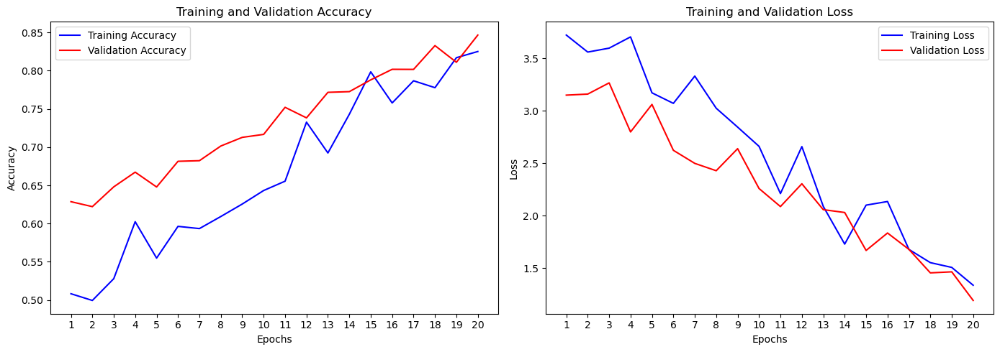

In [2]:
# Plot fine-tuning learning curves
plot_learning_curves(history1)

In [84]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Test loss: {test_loss:.2f}")

Test Accuracy: 0.82
Test loss: 1.26


## CNN model with Preprocessed images

In [7]:
base_dir = "./preprocessed_images"
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=40,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255)

train_generator_pre = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical'
)

val_generator_pre = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical'
)

test_generator_pre = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical'
)

Found 1890 images belonging to 9 classes.
Found 405 images belonging to 9 classes.
Found 405 images belonging to 9 classes.


In [24]:
# Step 3: Define the CNN Model
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(len(train_generator.class_indices), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_207 (Conv2D)         (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_208 (Conv2D)         (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_209 (Conv2D)         (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 26, 26, 128)     

In [91]:
history2 = model.fit(
    train_generator_pre,
    steps_per_epoch=len(train_generator_pre),
    epochs=20,
    validation_data=val_generator_pre,
    validation_steps=len(val_generator_pre)
)

Epoch 1/20
237/237 [==============================] - 524s 2s/step - loss: 2.4242 - accuracy: 0.6190 - val_loss: 2.3882 - val_accuracy: 0.7551
Epoch 2/20
237/237 [==============================] - 545s 1s/step - loss: 2.3792 - accuracy: 0.7237 - val_loss: 2.1817 - val_accuracy: 0.7330
Epoch 3/20
237/237 [==============================] - 509s 1s/step - loss: 2.2396 - accuracy: 0.6606 - val_loss: 2.2105 - val_accuracy: 0.7310
Epoch 4/20
237/237 [==============================] - 531s 2s/step - loss: 2.3249 - accuracy: 0.7191 - val_loss: 1.9510 - val_accuracy: 0.6813
Epoch 5/20
237/237 [==============================] - 468s 1s/step - loss: 2.3131 - accuracy: 0.6575 - val_loss: 2.1270 - val_accuracy: 0.7759
Epoch 6/20
237/237 [==============================] - 492s 1s/step - loss: 2.1102 - accuracy: 0.7769 - val_loss: 1.8153 - val_accuracy: 0.7033
Epoch 7/20
237/237 [==============================] - 469s 1s/step - loss: 2.1238 - accuracy: 0.7110 - val_loss: 1.8202 - val_accuracy: 0.6984

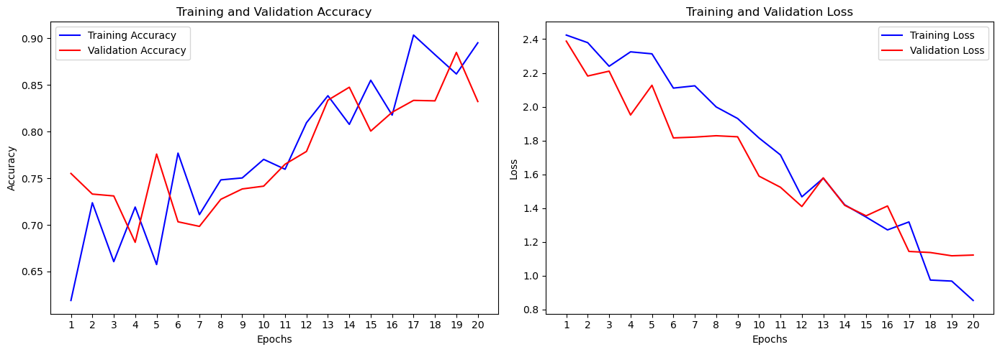

In [3]:
plot_learning_curves(history2)

In [93]:
test_loss, test_accuracy = model.evaluate(test_generator_pre)
print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Test loss: {test_loss:.2f}")

Test Accuracy: 0.87
Test loss: 0.95


## Proposed model: Preprocessed images and InceptionResNetV2 model

### Hyperparameter tuning

In [15]:
from tensorflow.keras import Model
def build_model_with_unfreeze(hp):
    # Load the base pre-trained model
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    
    # Decide how many layers to unfreeze
    unfreeze_layers = hp.Int('unfreeze_layers', min_value=0, max_value=len(base_model.layers), step=100)
    for layer in base_model.layers[:unfreeze_layers]:
        layer.trainable = False
    for layer in base_model.layers[unfreeze_layers:]:
        layer.trainable = True

    # Add custom layers
    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(
        hp.Int('units', min_value=256, max_value=1024, step=256), 
        activation='relu'
    )(x)
    x = layers.Dropout(hp.Float('dropout', min_value=0.2, max_value=0.5, step=0.15))(x)
    predictions = layers.Dense(len(train_generator_pre.class_indices), activation='softmax')(x)

    # Create the model
    model = Model(inputs=base_model.input, outputs=predictions)
    
    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3])),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

In [16]:
tuner = kt.Hyperband(
    build_model_with_unfreeze,
    objective='val_accuracy',
    max_epochs=20,  
    factor=3,
    directory='hyperband',
    project_name='inception_resnet_unfreeze_tuning'
)

early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)

# Search for the best hyperparameters
tuner.search(train_generator_pre, validation_data=val_generator_pre, epochs=20, callbacks=[early_stopping])

Reloading Tuner from hyperband\inception_resnet_unfreeze_tuning\tuner0.json


In [17]:
# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The optimal number of units in the dense layer is {best_hps.get('units')},
the optimal dropout rate is {best_hps.get('dropout')},
the optimal learning rate is {best_hps.get('learning_rate')},
and the optimal number of layers to unfreeze in the pre-trained model is {best_hps.get('unfreeze_layers')}.
""")


The optimal number of units in the dense layer is 384,
the optimal dropout rate is 0.30000000000000004,
the optimal learning rate is 0.0001,
and the optimal number of layers to unfreeze in the pre-trained model is 550.



In [94]:
# Build the model with the best hyperparameters
model = tuner.hypermodel.build(best_hps)

# Train the model
history3 = model.fit(
    train_generator_pre,
    steps_per_epoch=len(train_generator_pre),
    validation_data=val_generator_pre,
    epochs=20,
    callbacks=[early_stopping]
)

Epoch 1/7
237/237 [==============================] - 568s 1s/step - loss: 1.1242 - accuracy: 0.8079 - val_loss: 1.3888 - val_accuracy: 0.7516
Epoch 2/7
237/237 [==============================] - 552s 2s/step - loss: 1.0525 - accuracy: 0.8465 - val_loss: 1.2360 - val_accuracy: 0.7230
Epoch 3/7
237/237 [==============================] - 558s 2s/step - loss: 0.8861 - accuracy: 0.8662 - val_loss: 1.2063 - val_accuracy: 0.8161
Epoch 4/7
237/237 [==============================] - 567s 2s/step - loss: 0.9446 - accuracy: 0.8921 - val_loss: 0.7855 - val_accuracy: 0.7891
Epoch 5/7
237/237 [==============================] - 561s 1s/step - loss: 0.9061 - accuracy: 0.8589 - val_loss: 0.7026 - val_accuracy: 0.9430
Epoch 6/7
237/237 [==============================] - 550s 2s/step - loss: 0.6764 - accuracy: 0.9689 - val_loss: 0.5112 - val_accuracy: 0.9117
Epoch 7/7
237/237 [==============================] - 551s 1s/step - loss: 0.6633 - accuracy: 0.9719 - val_loss: 0.3476 - val_accuracy: 0.9835


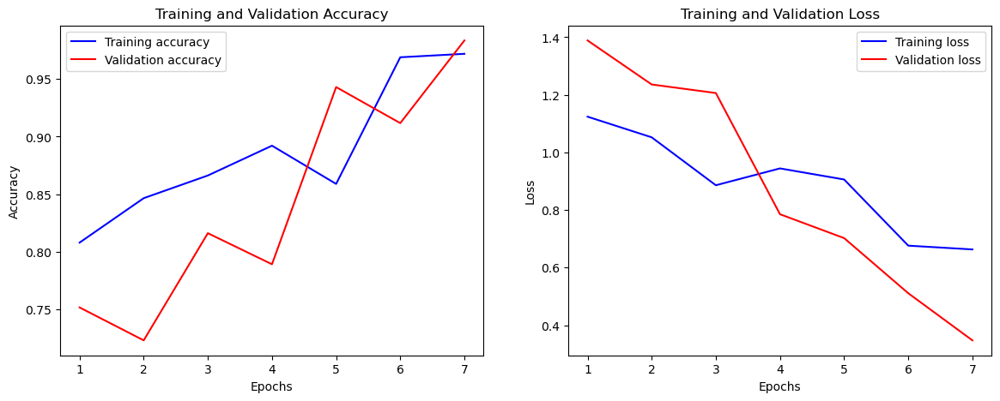

In [5]:
# Plot fine-tuning learning curves
plot_learning_curves(history3)

In [95]:
test_loss, test_accuracy = model.evaluate(test_generator_pre)
print(f"Test Accuracy: {test_accuracy:.3f}")
print(f"Test loss: {test_loss:.3f}")

Test Accuracy: 0.987
Test loss: 0.453


In [9]:
from sklearn.metrics import classification_report
import numpy as np

test_generator_pre.reset()  # Ensure generator starts from the beginning
predictions = model.predict(test_generator, steps=len(test_generator))

predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

                       precision    recall  f1-score   support

       ashgourd_fresh       1.00      1.00      1.00        45
    ashgourd_nitrogen       1.00      1.00      1.00        45
   ashgourd_potassium       1.00      0.98      0.99        45
    bittergourd_fresh       0.98      0.96      0.97        45
 bittergourd_nitrogen       0.96      1.00      0.98        45
bittergourd_potassium       1.00      1.00      1.00        45
     snakegourd_fresh       1.00      0.96      0.98        45
  snakegourd_nitrogen       0.96      1.00      0.98        45
 snakegourd_potassium       1.00      1.00      1.00        45

             accuracy                           0.99       405
            macro avg       0.99      0.99      0.99       405
         weighted avg       0.99      0.99      0.99       405



### Performance analysis of the models

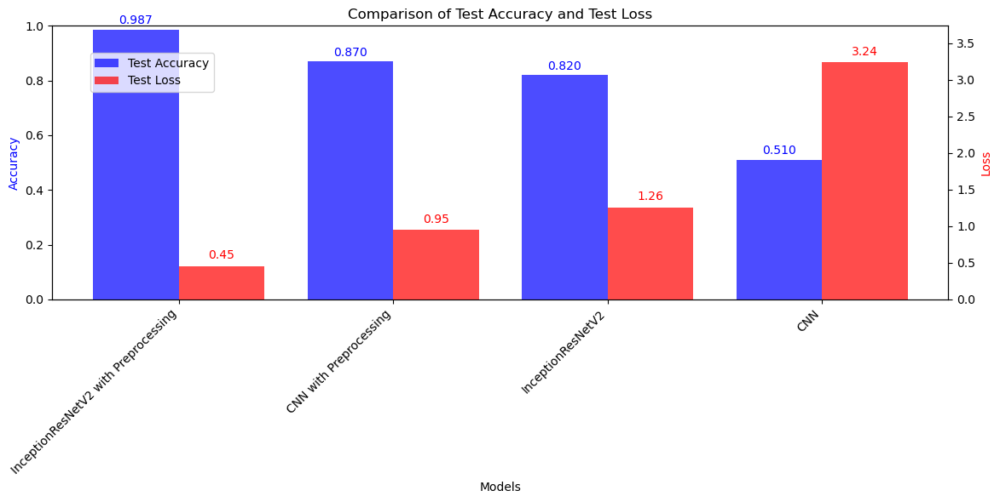

In [102]:
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot Test Accuracy
bars1 = ax1.bar(x - width / 2, test_accuracies, width, label='Test Accuracy', color='blue', alpha=0.7)
# Plot Test Loss
ax2 = ax1.twinx()
bars2 = ax2.bar(x + width / 2, test_losses, width, label='Test Loss', color='red', alpha=0.7)

# Adding labels and title
ax1.set_xlabel("Models")
ax1.set_ylabel("Accuracy", color='blue')
ax2.set_ylabel("Loss", color='red')
ax1.set_title("Comparison of Test Accuracy and Test Loss")
ax1.set_xticks(x)
ax1.set_xticklabels(models, rotation=45, ha="right")
ax1.set_ylim(0, 1)
ax2.set_ylim(0, max(test_losses) + 0.5)

for bar in bars1:
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02,
             f"{bar.get_height():.3f}", ha='center', color='blue', fontsize=10)

# Add annotations for loss
for bar in bars2:
    ax2.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1,
             f"{bar.get_height():.2f}", ha='center', color='red', fontsize=10)

fig.legend([bars1, bars2], ['Test Accuracy', 'Test Loss'], loc='upper left', bbox_to_anchor=(0.1, 0.9))

plt.tight_layout()
plt.show()

## Prediction of image from model

1/1 [==============================] - 0s 77ms/step


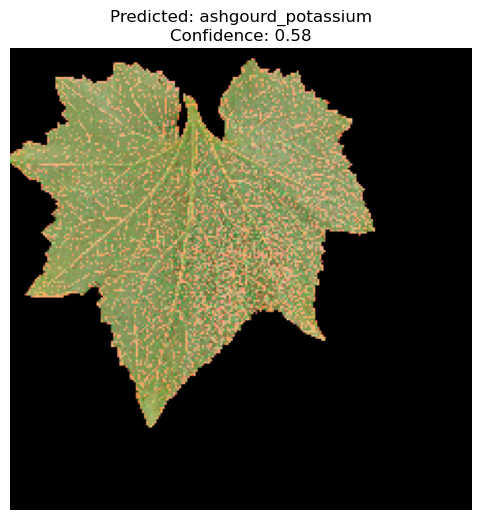

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def predict_and_plot(model, image_path, class_indices):
    # Load and preprocess the image
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0  # Normalize the image
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    # Predict the class
    predictions = model.predict(img_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]

    # Map index to class name
    class_names = {v: k for k, v in class_indices.items()}  # Reverse the class_indices dictionary
    predicted_class_name = class_names[predicted_class_index]

    # Plot the image and the prediction
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Predicted: {predicted_class_name}\nConfidence: {predictions[0][predicted_class_index]:.2f}")
    plt.axis('off')
    plt.show()

image_path =  "./preprocessed_images/train/ashgourd_potassium/RGB (20).JPG"
predict_and_plot(model, image_path, train_generator_pre.class_indices)